In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random
import scvi

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
Global seed set to 0
/opt/apps/python/3.8.0/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.1.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [2]:
plate_palette = sns.color_palette("husl", n_colors=3)
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 /500 UMI merged adata

In [5]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/GonadsMalepreprocessed.h5ad")


In [6]:
adata.layers['raw_counts'] = adata.X.copy()


In [7]:
adata

AnnData object with n_obs × n_vars = 1355404 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', 'B6J', 'NODJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

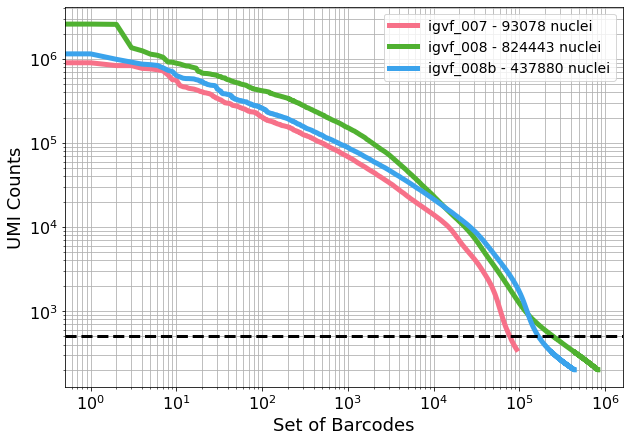

In [8]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [9]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


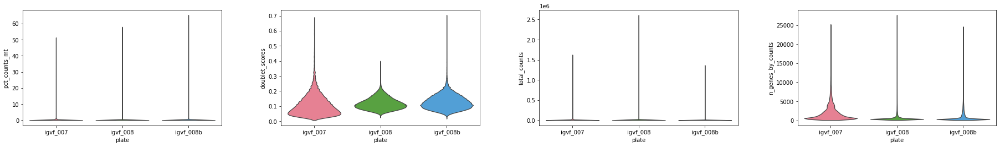

In [10]:
plate_palette = sns.color_palette("husl", n_colors=3)

sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

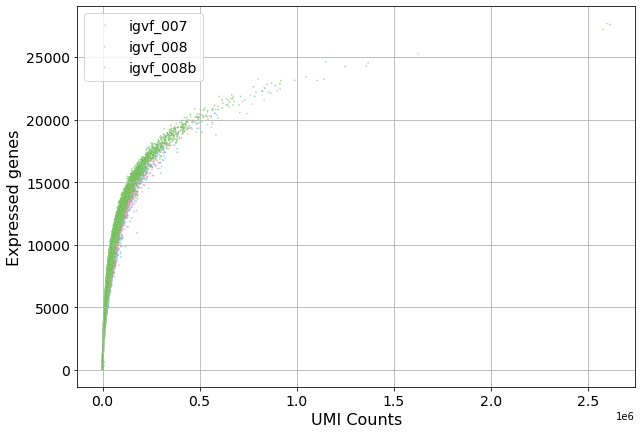

In [11]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [12]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


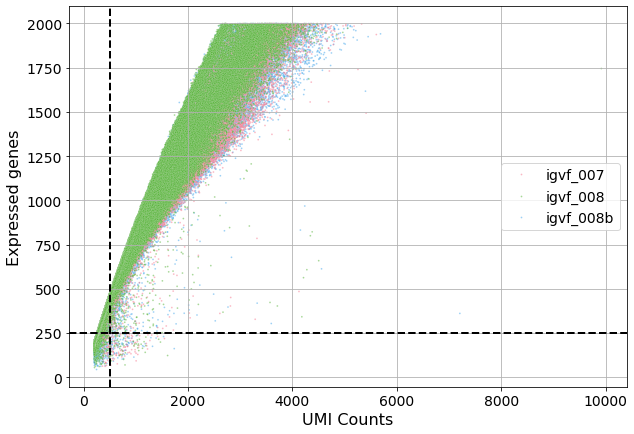

In [13]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [14]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 263 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', 'B6J', 'NODJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [3]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/GonadsMale_processed.h5ad")


In [4]:
print(adata.obs['Genotype'].value_counts())

adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

Genotype
NODJ      72817
WSBJ      70993
B6J       60283
NZOJ      59765
AJ        58518
129S1J    52449
CASTJ     51487
PWKJ      50811
tie         206
Name: count, dtype: int64
Genotype
NODJ      72817
WSBJ      70993
B6J       60283
NZOJ      59765
AJ        58518
129S1J    52449
CASTJ     51487
PWKJ      50811
Name: count, dtype: int64


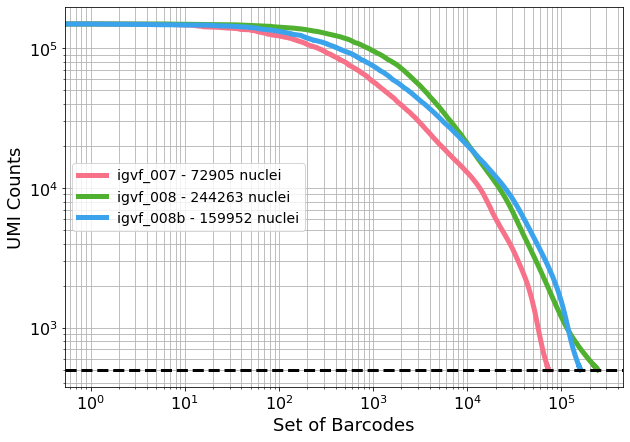

In [5]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

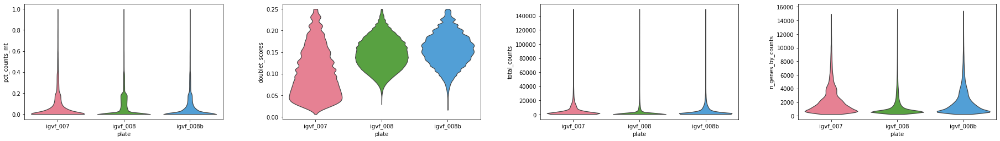

In [6]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

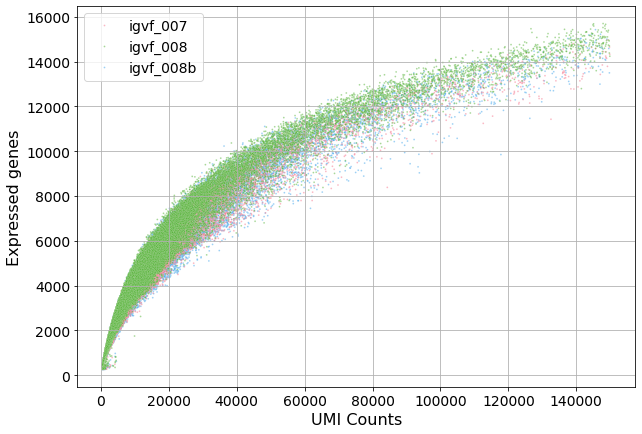

In [7]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

# Check clustering
Plate, sex, genotype

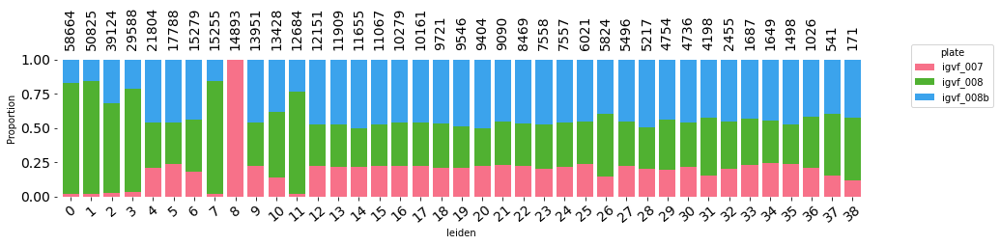

In [8]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)


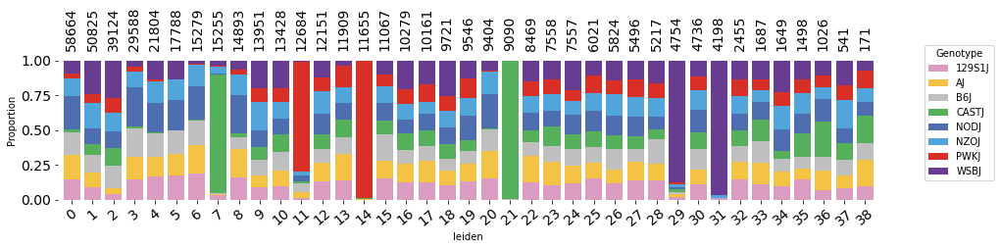

In [9]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


In [ ]:
# # adjust mouse_tissue_id
# # sample genotypes for each 'Multiplexed_sampleN'
# ms1 = ['B6J','AJ','WSBJ','129S1J']
# ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# # Define a function to update 'Mouse_Tissue_ID' based on conditions
# def update_mouse_tissue_id(row):
#     if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
#         if row['Genotype'] in ms1:
#             return row['Multiplexed_sample1']
#         elif row['Genotype'] in ms2:
#             return row['Multiplexed_sample2']
#     return row['Mouse_Tissue_ID']

# meta = adata.obs

# # Apply the function to update the 'Mouse_Tissue_ID' column
# meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
# adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
# pf.stacked_barplot_proportions(adata.obs, 
#                                'leiden', 'Mouse_Tissue_ID',
#                                flip=False, fsize = (15,3), 
#                                annotations = True)

In [13]:
meta.loc[meta['leiden'] == "31", 'Mouse_Tissue_ID'].value_counts().head()

Mouse_Tissue_ID
057_WSBJ_10M_25    1091
063_WSBJ_10M_25     992
059_WSBJ_10M_25     804
061_WSBJ_10M_25     551
GH_M1_25            237
Name: count, dtype: int64

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


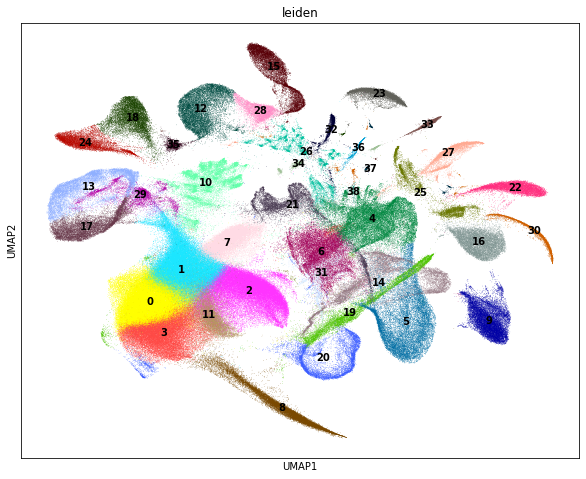

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


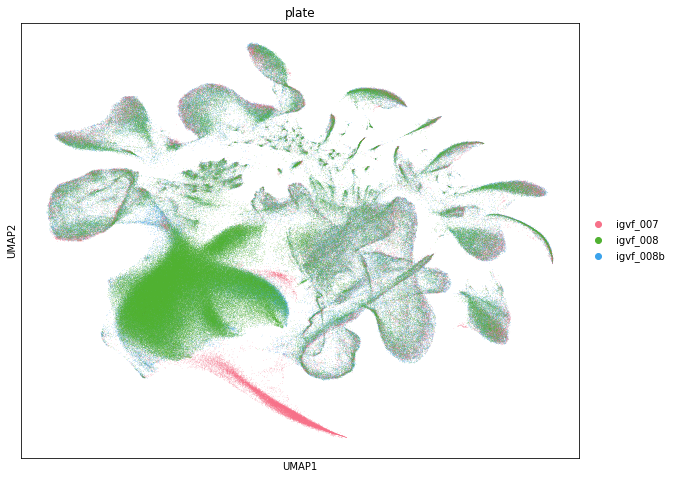

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


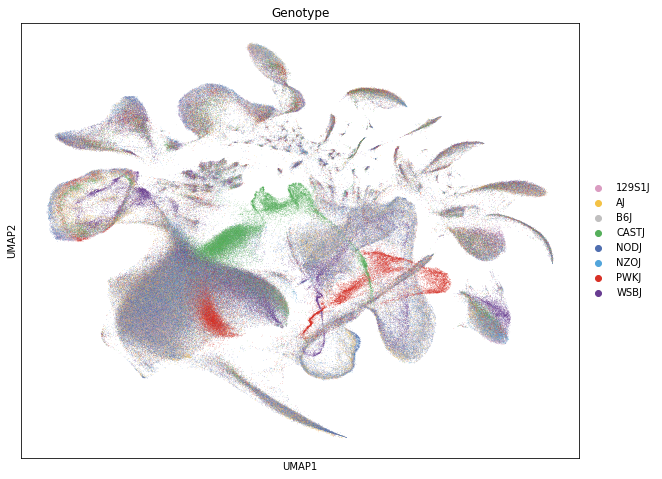

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


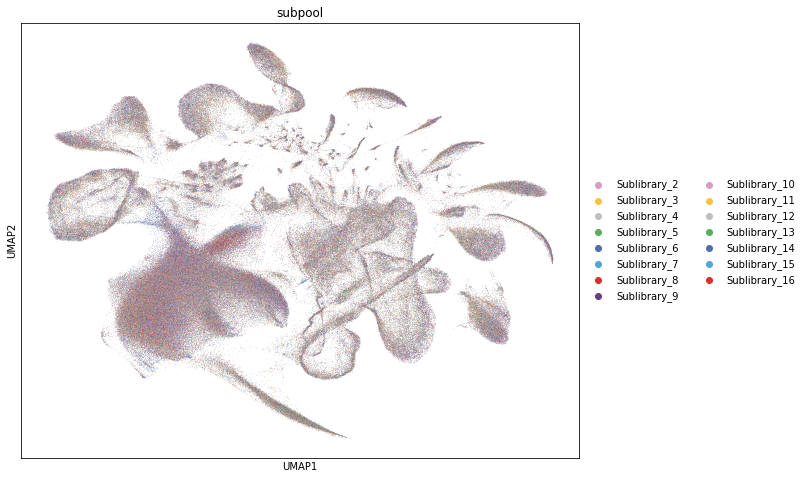

In [14]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)

sc.pl.umap(adata, color=['subpool'], size = 0.8, palette = geno_palette)




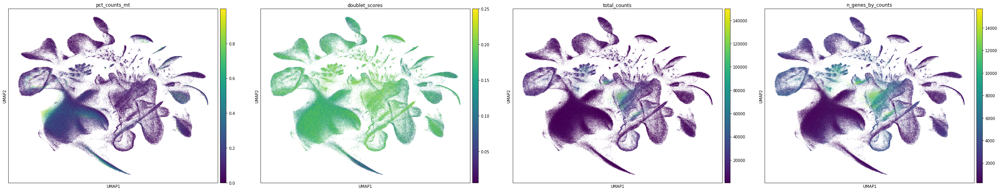

In [15]:
adata.var_names  = adata.var['gene_name']


sc.pl.umap(adata, color=['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'], 
           size = 1, sort_order = True)


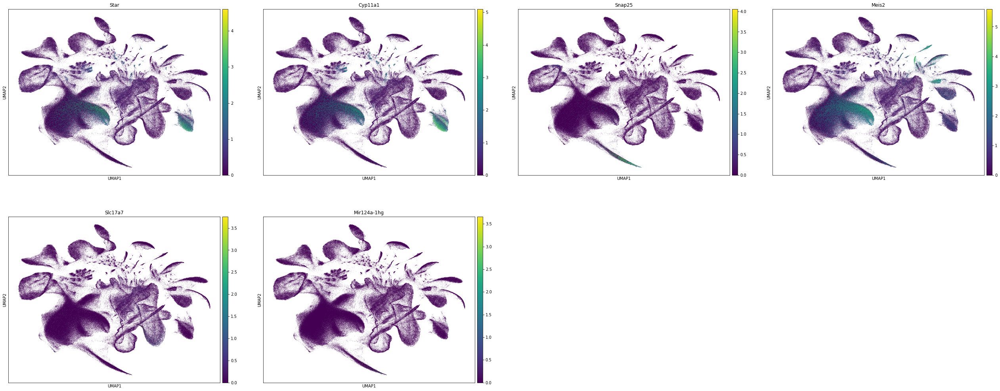

In [16]:
sc.pl.umap(adata, color=['Star','Cyp11a1','Snap25','Meis2','Slc17a7','Mir124a-1hg'], 
           size = 1, sort_order = True)


# Remove large low-quality clusters and re-cluster

In [5]:
adata = adata[~adata.obs['leiden'].isin(["0","1","2","3","7","11","8"])]



In [6]:
adata

View of AnnData object with n_obs × n_vars = 256090 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', 'AJ', 'PWKJ', 'B6J', 'NODJ', '129S1J', 'CASTJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'

In [7]:
adata.uns['log1p']["base"] = None

In [8]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]



/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [9]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarni

In [10]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)

In [ ]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


In [42]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


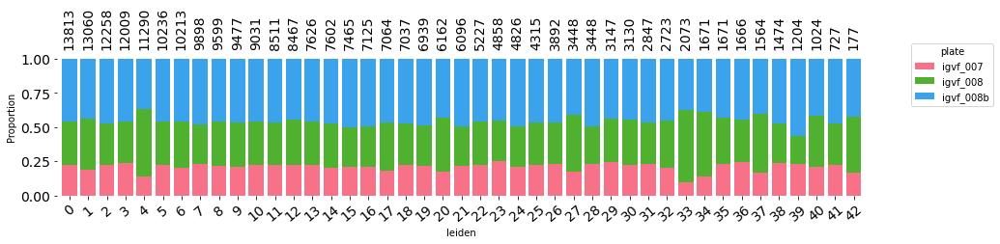

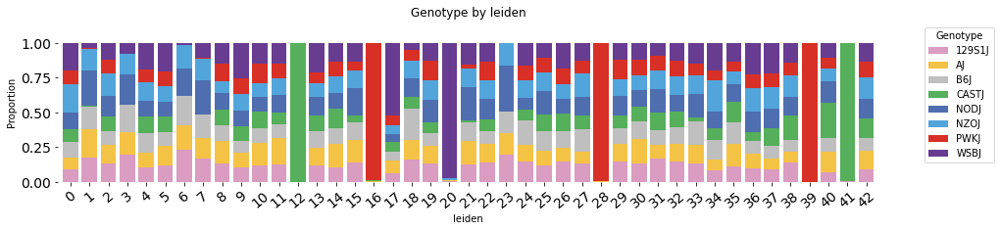

In [96]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = False)


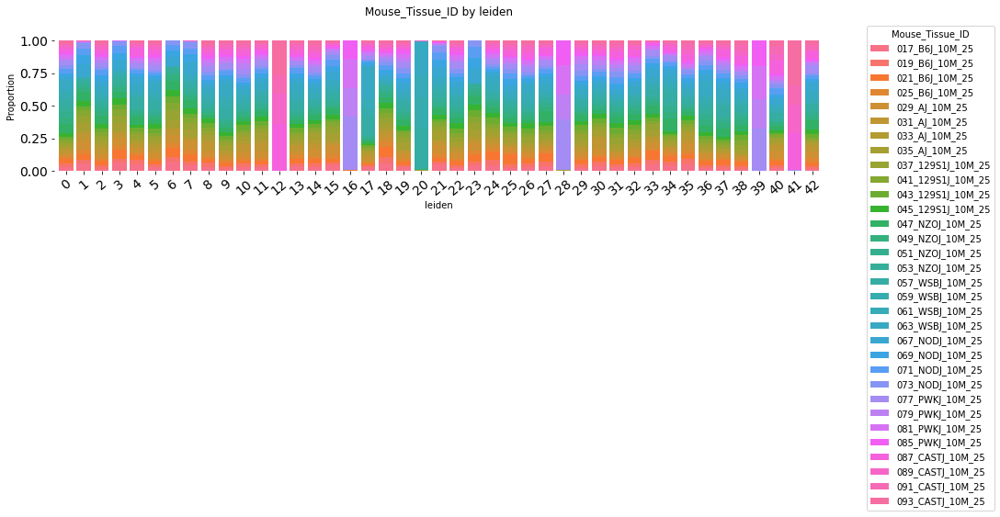

In [110]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Mouse_Tissue_ID',
                               flip=False, fsize = (15,3), 
                               annotations = False)

In [111]:
adata.obs.loc[adata.obs['leiden'] == "41", 'Mouse_Tissue_ID'].value_counts().head()



Mouse_Tissue_ID
093_CASTJ_10M_25    250
087_CASTJ_10M_25    209
089_CASTJ_10M_25    158
091_CASTJ_10M_25    107
077_PWKJ_10M_25       1
Name: count, dtype: int64

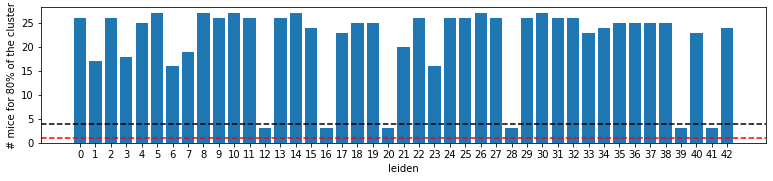

In [207]:
unique_clusters = adata.obs['leiden'].unique()

result_dict = {'leiden': [], 'n_mice_per_cluster': []}

for cluster in unique_clusters:
    # Filter data for the specific cluster
    cluster_data = adata.obs.loc[adata.obs['leiden'] == cluster, 'Mouse_Tissue_ID'].value_counts()
    cumulative_percentage = cluster_data.cumsum() / cluster_data.sum()
    num_tissue_ids_percent = (cumulative_percentage <= 0.9).sum() 
    
    result_dict['leiden'].append(cluster)
    result_dict['n_mice_per_cluster'].append(num_tissue_ids_percent)

result_df = pd.DataFrame(result_dict)

result_df['leiden'] = pd.to_numeric(result_df['leiden'])
result_df = result_df.sort_values(by='leiden')
result_df['leiden'] = result_df['leiden'].astype(str)

plt.figure(figsize=(13,2.5))
plt.bar(result_df['leiden'], result_df['n_mice_per_cluster'])
plt.xlabel('leiden')
plt.ylabel('# mice for 80% of the cluster')

plt.axhline(y=4, color='black', linestyle='--')
plt.axhline(y=1, color='red', linestyle='--')


plt.show()

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


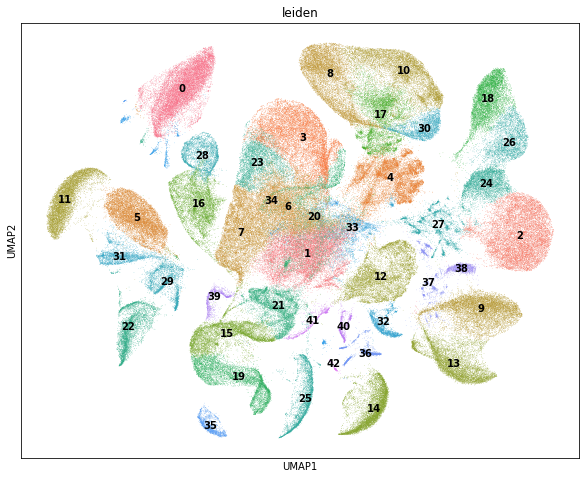

In [7]:
plt.rcParams['figure.figsize'] = (10, 8)

leiden_palette = sns.color_palette("husl", n_colors=51)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data',palette=leiden_palette)




/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


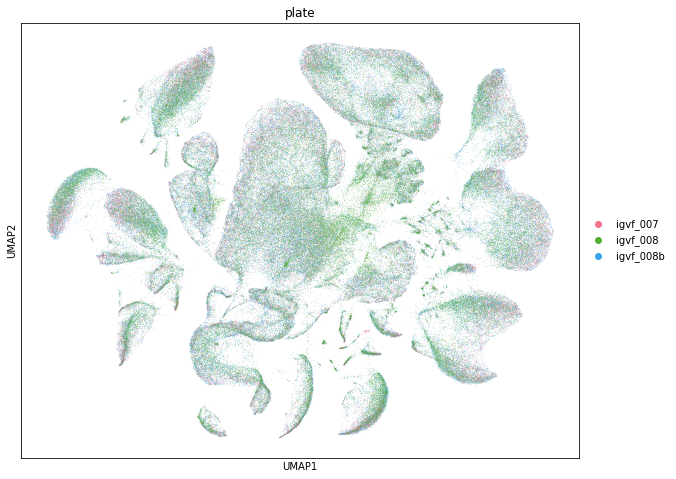

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


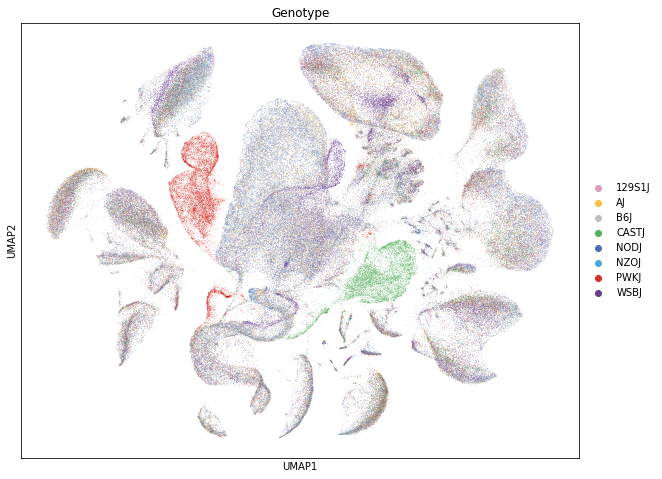

In [8]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


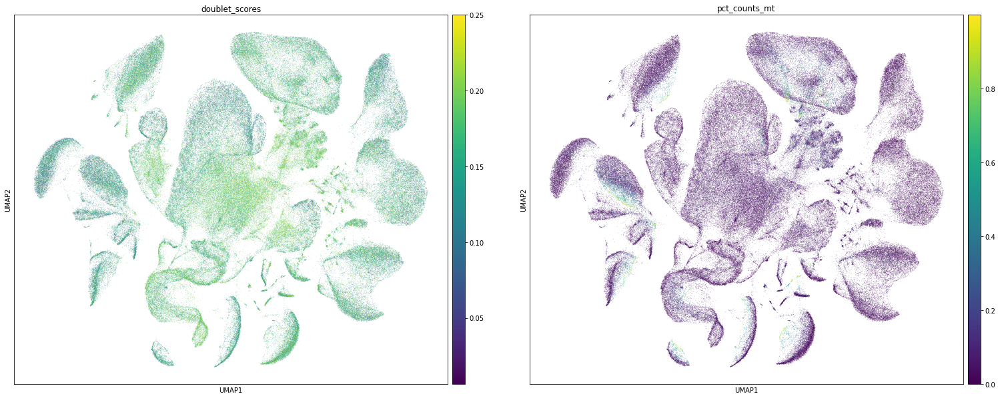

In [96]:
sc.pl.umap(adata, color=['doublet_scores','pct_counts_mt'], size=1)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: UserWarning: The palette list has more values (51) than needed (43), which may not be intended.
  ax = sns.violinplot(


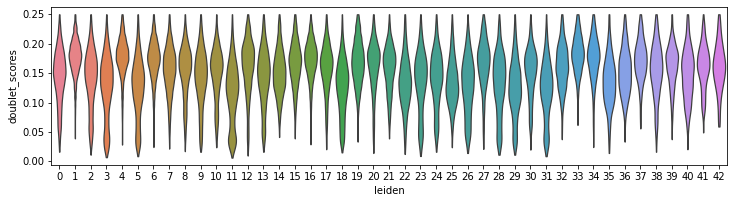

In [10]:
plt.rcParams['figure.figsize'] = (10, 3)

sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: UserWarning: The palette list has more values (51) than needed (43), which may not be intended.
  ax = sns.violinplot(


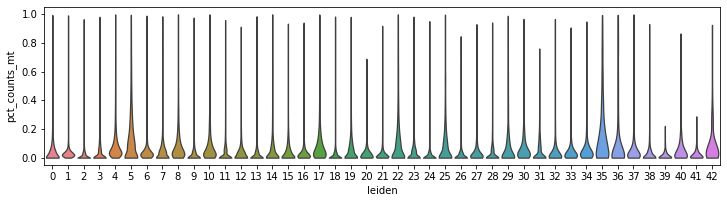

In [11]:
plt.rcParams['figure.figsize'] = (10, 3)

sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

# Prepare reference dataset
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE145443

In [31]:
from scipy.sparse import csr_matrix


In [34]:
mat = pd.read_csv("../IGVF_analysis/external_ref/GSE145443_raw_SC_epid.tsv", sep="\t")

var = mat[['Gene']].copy()
var.columns = ["gene_name"]


mat = mat.drop(columns=['Gene']).T
X_sparse = csr_matrix(mat)


In [35]:
obs = pd.read_csv("../IGVF_analysis/external_ref/GSE145443_metadata_SC_epid.tsv", sep="\t")


In [36]:
adata = anndata.AnnData(X_sparse, obs=obs, var=var)

adata.obs.index = obs['cell_Barcode']
adata.var_names = adata.var['gene_name']


/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [40]:
adata.write_h5ad('../IGVF_analysis/external_ref/epididymis_vas_deferens_ref.h5ad')


# Label transfer

## Merge and preprocess again

In [49]:
ref_data = sc.read('../IGVF_analysis/external_ref/epididymis_vas_deferens_ref.h5ad')


In [51]:
ref_data.obs['final_celltype'].value_counts()

final_celltype
Connective          975
Basal               917
StemStromalVas      549
PC04                516
PC08                400
PC09                365
PC05                353
PC02                346
PC06                341
PC03                332
StromalIL6          319
BasalLowUM          315
Muscle              262
Endothelial         245
PC14                244
MuscleGfra4         240
PC01                239
AngryVasStromal     226
Clear               216
PC07                183
BasalNotch2         165
Fibroblast          153
PC10                151
PC15                144
PC13                139
PC11                129
Macrophages         104
Narrow               78
PC12                 74
ClearKrt14           54
TCell                44
MacrophagesTrem2     26
Dendritic            21
BasalMacrophages     15
Name: count, dtype: int64

In [ ]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')
adata.var_names  = adata.var['gene_name']

adata = adata.concatenate(ref_data)


In [ ]:
adata.layers["raw_counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata


In [ ]:
sc.pp.highly_variable_genes(adata, flavor = 'seurat_v3', n_top_genes=2000,
                            layer = "raw_counts", batch_key="batch", subset = True)


## Run scvi

In [ ]:
scvi.model.SCVI.setup_anndata(adata, layer = 'raw_counts', batch_key='batch')
vae = scvi.model.SCVI(adata)
vae.train()


In [ ]:
adata.obs['final_celltype'] = adata.obs['final_celltype'].astype('category')

adata.obs['final_celltype'] = adata.obs['final_celltype'].cat.add_categories('Unknown')
adata.obs = adata.obs.fillna(value = {'final_celltype': 'Unknown'})



In [ ]:
lvae = scvi.model.SCANVI.from_scvi_model(vae, adata = adata, 
                                         unlabeled_category = 'Unknown',
                                         labels_key = 'final_celltype')

lvae.train(max_epochs=20, n_samples_per_label=100)

adata.obs['predictions'] = lvae.predict(adata)


In [ ]:
adata.obs['cell_barcodes'] = adata.obs.index.map(lambda x: x[:-2])

cell_mapper = dict(zip(adata.obs.cell_barcodes, adata.obs.predictions))

In [ ]:
cell_mapper_df = pd.DataFrame(list(cell_mapper.items()), columns=['cell_barcodes', 'predictions'])


In [ ]:
cell_mapper_df.head()

In [ ]:
cell_mapper_df.to_csv("malegonads_cell_mapper.csv")

## Map back to original data

In [57]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


In [60]:
cell_mapper = pd.read_csv("malegonads_cell_mapper.csv", index_col = 0)

In [ ]:
adata.obs['predictions'] = adata.obs.index.map(cell_mapper)


In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


In [4]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


In [65]:
plt.rcParams['figure.figsize'] = (10, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


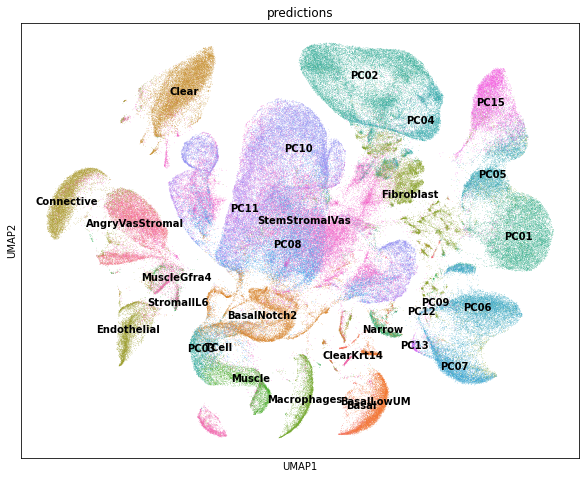

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


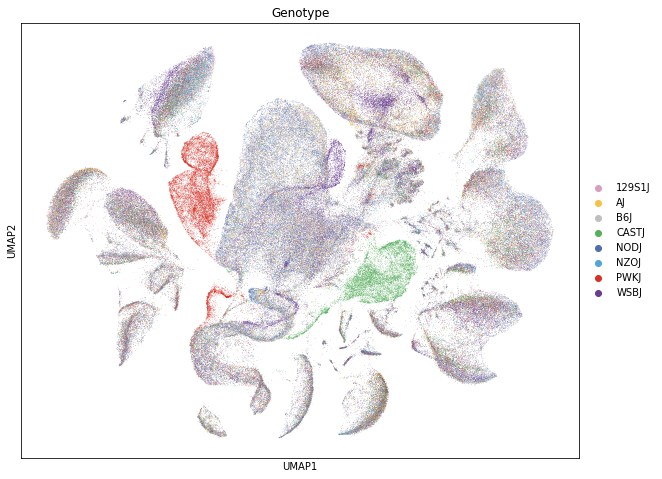

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


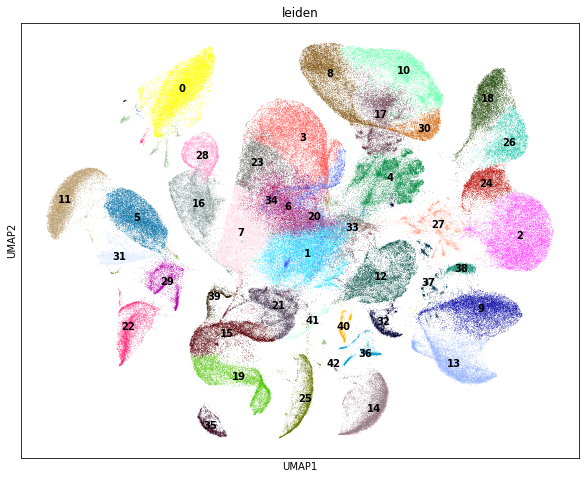

In [66]:
color_palette = sns.color_palette("husl", n_colors=30)

sc.pl.umap(adata, color=['predictions'], size=1, legend_loc = 'on data',palette=color_palette)
sc.pl.umap(adata, color=['Genotype'], size=1,palette=geno_palette)
sc.pl.umap(adata, color=['leiden'], size=1,legend_loc = 'on data')



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


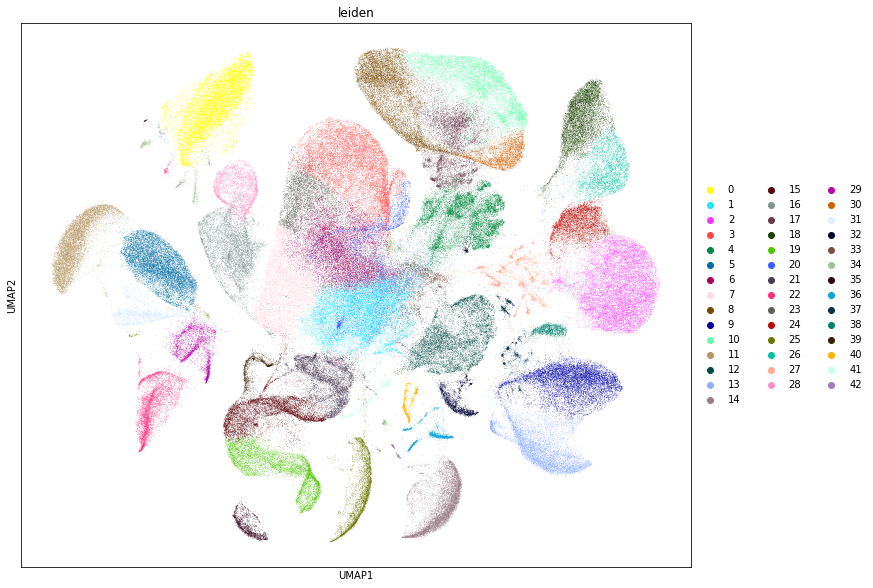

In [196]:
sc.pl.umap(adata, color=['leiden'], size=1)


In [16]:
refmeta = pd.read_csv("../IGVF_analysis/external_ref/GSE145443_metadata_SC_epid.tsv", sep="\t")


In [25]:
refmeta[refmeta['final_celltype'] == "PC05"]['sample'].value_counts()


sample
Caput    353
Name: count, dtype: int64

In [24]:
refmeta[refmeta['final_celltype'] == "PC01"]['sample'].value_counts()


sample
Corpus    172
Caput      67
Name: count, dtype: int64

In [23]:
refmeta[refmeta['final_celltype'] == "PC06"]['sample'].value_counts()


sample
Corpus    327
Cauda      13
Caput       1
Name: count, dtype: int64

In [22]:
refmeta[refmeta['final_celltype'] == "PC07"]['sample'].value_counts()


sample
Cauda     166
Vasdef     16
Corpus      1
Name: count, dtype: int64

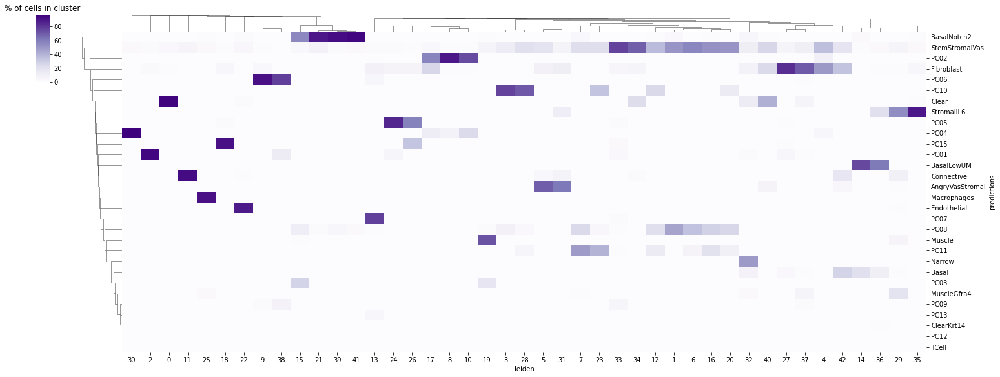

In [208]:
obs = adata.obs
confusion_matrix_df = pd.crosstab(obs['leiden'], obs['predictions'])
confusion_matrix_df_percentage = confusion_matrix_df.div(confusion_matrix_df.sum(axis=1), axis=0) * 100
confusion_matrix_df_percentage_transposed = confusion_matrix_df_percentage.transpose()

sns.clustermap(confusion_matrix_df_percentage_transposed, 
               cmap='Purples',
               dendrogram_ratio=0.05,
               cbar_pos=(-0.04, 0.8, 0.015, 0.18),
               cbar=True,
               method='average', 
               metric='euclidean', 
               figsize=(20, 8), 
               col_cluster=True, 
               row_cluster=True)
plt.title('% of cells in cluster')
plt.show()

# Check marker gene expression

In [3]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsMale_filtered.h5ad')


In [4]:
adata.var_names  = adata.var['gene_name']


In [72]:
# https://elifesciences.org/articles/55474#data
marker_genes_dict = {
    "Caput": ["Lcn8","Defb12","Gpx5","Cst12","Rnase10","Agr2","Bmyc","Pemt","Spink11","Mettl7a1","Etv5","Ido1","Ifngr2","Exosc6"],
    "Corpus": ["Spint4","Cyp17a1","Car3","Gdf11","Npy","Aqp6","Hexb","Aspg","Rnase11","Agt"],
    "Cauda": ["Spink14","S100a8","Defb2","Smarca1"],
    "Other mettls": ["Mettl3","Mettl14"],          
               
}



categories: 0, 1, 2, etc.
var_group_labels: Caput, Corpus, Cauda, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


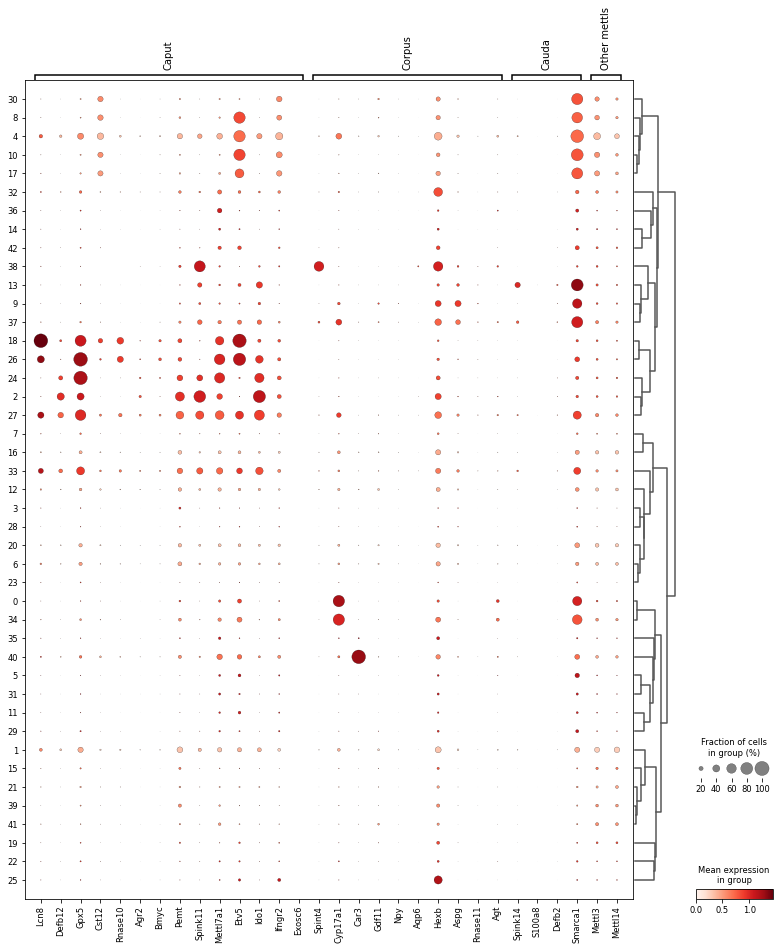

In [73]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


categories: 0, 1, 2, etc.
var_group_labels: Initial_segment, Caput, Corpus1, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


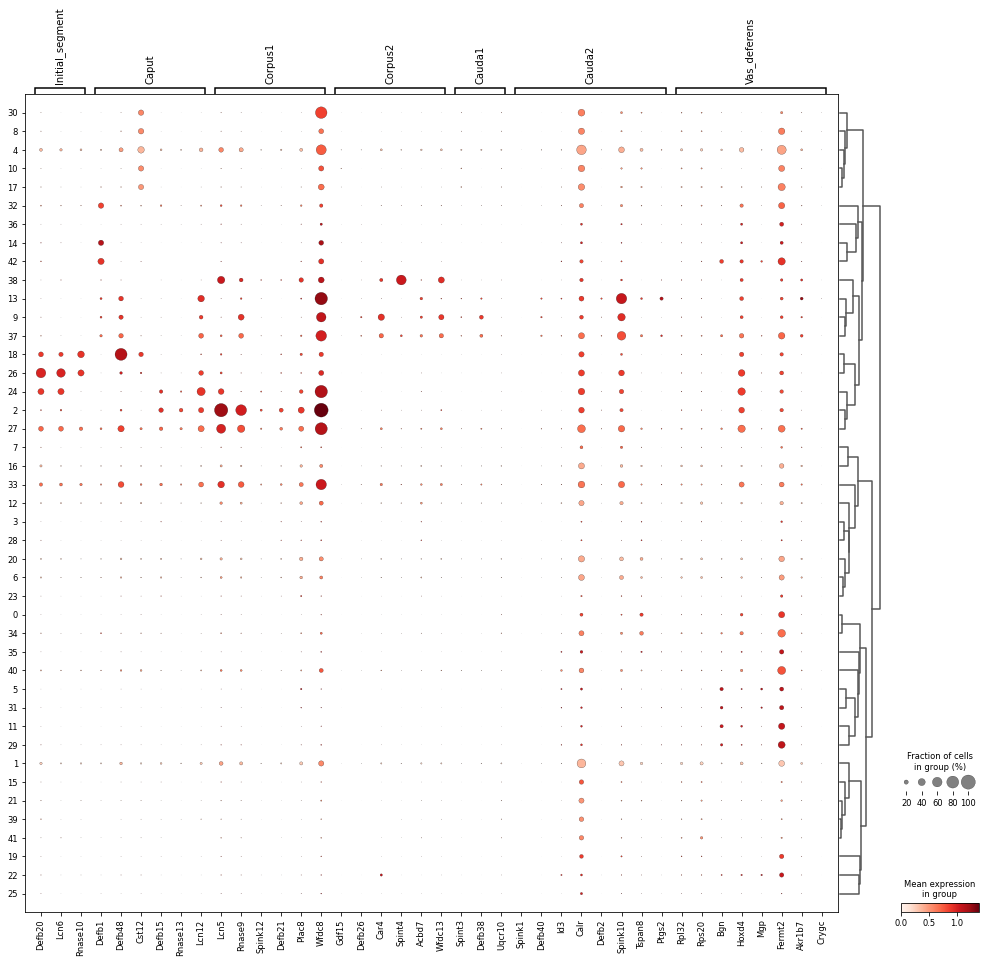

In [29]:
# https://elifesciences.org/articles/55474#data
marker_genes_dict = {
    "Initial_segment": ["Defb20","Lcn6","Rnase10"],
    "Caput": ["Defb1","Defb48","Cst12","Defb15","Rnase13","Lcn12"],
    "Corpus1": ["Lcn5","Rnase9","Spink12","Defb21","Plac8","Wfdc8"],
    "Corpus2": ["Gdf15","Defb26","Car4","Spint4","Acbd7","Wfdc13"],
    "Cauda1": ["Spint3","Defb38","Uqcr10"],
    "Cauda2": ["Spink1","Defb40","Id3","Calr","Defb2","Spink10","Tspan8","Ptgs2"],
    "Vas_deferens": ["Rpl32","Rps20","Bgn","Hoxd4","Mgp","Fermt2","Akr1b7","Crygc"],
         
               
}

sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


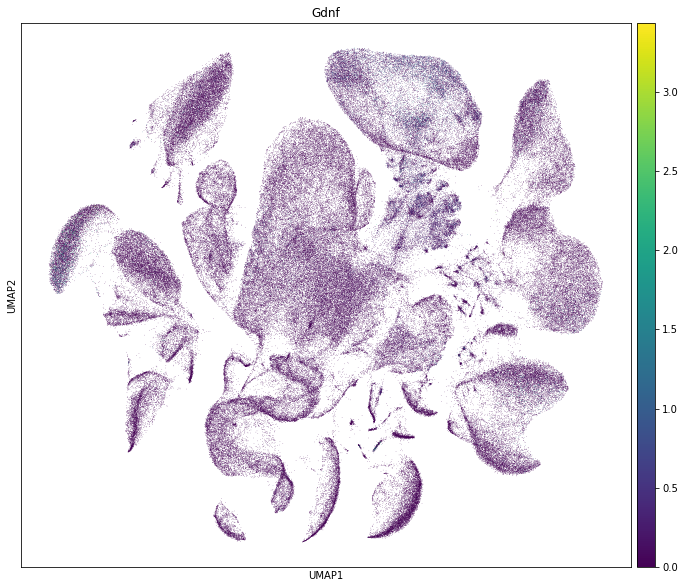

In [172]:
sc.pl.umap(adata, color=['Gdnf'], size=1, sort_order = True)

# Muc16, Gpm6a, Flrt2, Efemp1, Col3a1, Plxna4, Cdh11, Pkhd1l1, Igfbp5, C3, Il16

categories: 0, 1, 2, etc.
var_group_labels: Adipocyte, Arterial_endothelial, Atrial_cardiomyocyte, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


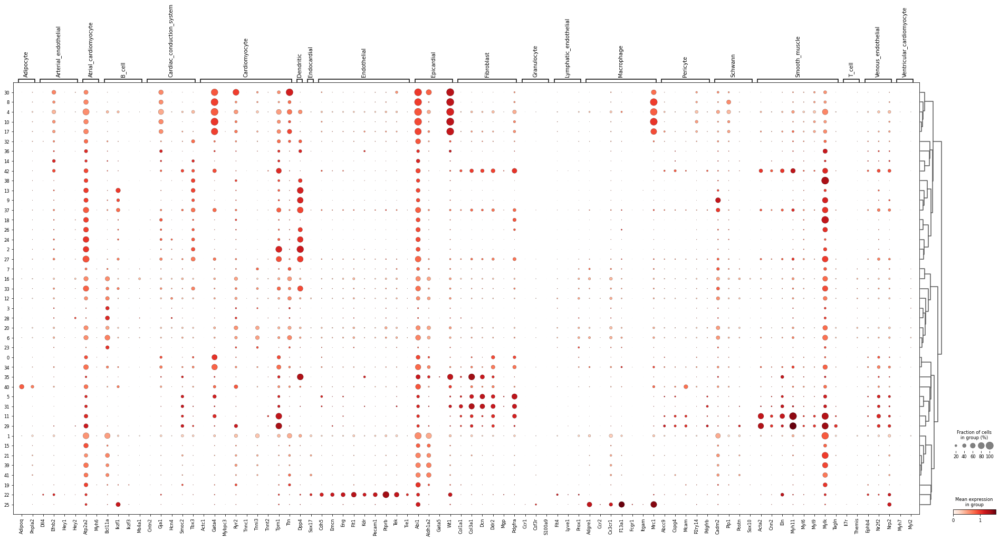

In [214]:
my_markers_df = pd.read_csv("IGVF_curated_markers.csv")
my_markers_df = my_markers_df[my_markers_df['Gene'].isin(adata.var_names)]
my_markers_df = my_markers_df[my_markers_df['Tissue'] == 'Heart']

marker_genes_dict = my_markers_df.groupby('Subtype')['Gene'].agg(list).to_dict()


sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


categories: 0, 1, 2, etc.
var_group_labels: Unknown, Other


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


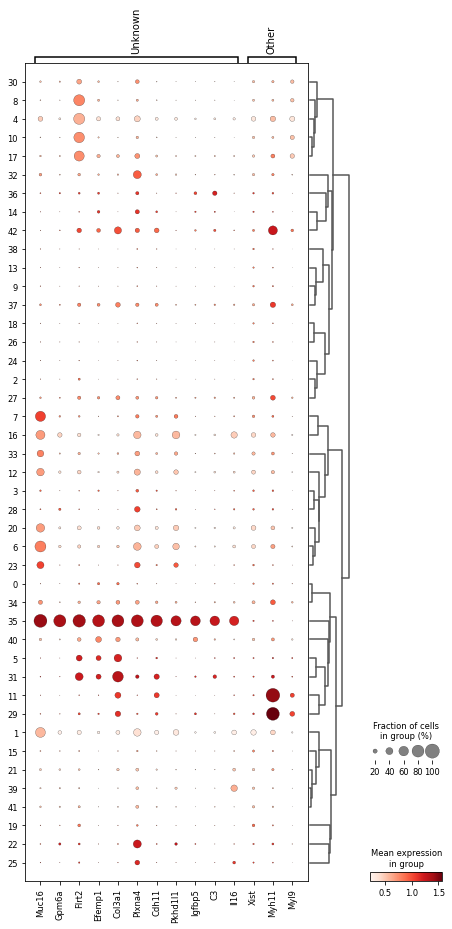

In [213]:
#https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8312960/
#https://www.sciencedirect.com/science/article/pii/S0006291X21002539
#https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4076373/

curated_marker_genes_dict = {
#     "Spermatogonia":["Tex15","Dmrt1","Morc1","Dazl","Sycp3"],
#     "Spermatocyte":["Tex14","Sycp1","Sycp2","Spata16","Ybx2","Piwil1"],
#     "Round_spermatid":["Acrv1","Spaca3","Spaca4"],
#     "Elongating_spermatid":["Prm1","Prm2","Tnp1","Spata3","Tssk6"],
#     "Spermatozoa": ['Tnp1','Tnp2','Prm2'],
    
    
#     "Principal_cells": ["Spink8","Pax8"],
#     "Efferent_duct": ["Vil1","Esr1"],
#     "Initial_segment": ["Lcn9","Lcn8"],
#     "Caput": ["Lcn2"],
#     "Corpus": ["Defb23","Rnase9","Lcn5"],
#     "Cauda":["Wfdc10","Ptgds","Serpine2"],
#     "Leydig": ["Cyp17a1","Hsd17b11","Hsd3b6","Vcam1"],     
#     "Sertoli": ["Kitl","Wt1","Sox9"],
#     "Basal": ['Krt5','Cldn1','Ptgs1','Cd9'],
#     "Clear": ["Atp6v1e1","Foxi1"],
#     "Narrow": ["Car2"],
    
    
#     "Stromal": ["Cd34","Col1a2","Gsn"],
#     "Fibroblast": ["Dcn","Col4a4","Lama2"],
#     "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
#     "Macrophage": ["Adgre1","F13a1"],
#     "Smooth_muscle": ["Myh11","Acta2","Myl9"],
#     "Adipocyte": ["Adipoq","Pnpla2","Pparg"],
    "Unknown": ["Muc16","Gpm6a","Flrt2",
                "Efemp1","Col3a1","Plxna4","Cdh11",
                "Pkhd1l1","Igfbp5","C3","Il16"],
    "Other": ["Xist","Myh11","Myl9"]
               
}

# adatas = adata[adata.obs['celltype'].isin(["Spermatogonia","Spermatocyte","Spermatid","Spermatozoa"])]

# sc.tl.dendrogram(adatas, groupby = 'leiden')
sc.pl.dotplot(adata, curated_marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


# Find cluster level markers

In [179]:
adata.uns['log1p']['base'] = None

In [180]:
adata.var_names  = adata.var['gene_name']


In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [ ]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
result = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})


In [15]:
result.to_csv("gonadsmale_cluster_markers.csv")

# Assign celltypes to clusters

In [197]:
annots = pd.read_csv("GonadsMale_annotations.csv")
annots['leiden'] = annots['leiden'].astype(str)
annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['celltype'].to_dict()


In [198]:
adata.obs['celltype'] = adata.obs['leiden'].map(annotation_dict)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


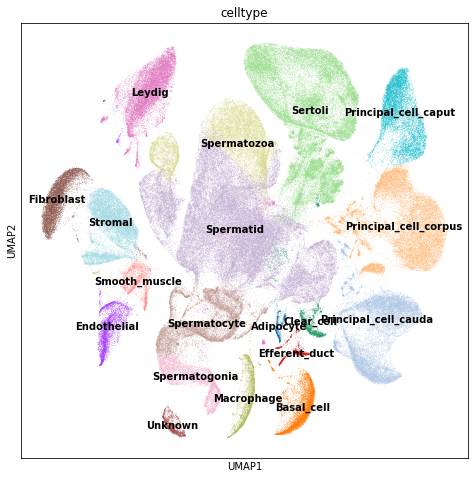

In [219]:
plt.rcParams['figure.figsize'] = (8, 8)

sc.pl.umap(adata, color=['celltype'], size=1, legend_loc = 'on data')


In [200]:
sc.tl.dendrogram(adata, groupby = 'celltype')

categories: Adipocyte, Basal_cell, Clear_cell, etc.
var_group_labels: Leydig, Sertoli, Stromal, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


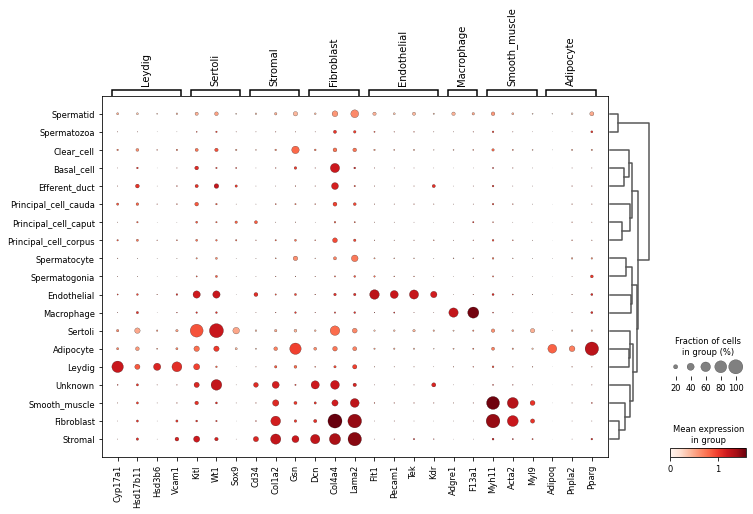

In [201]:
sc.pl.dotplot(adata, curated_marker_genes_dict, 'celltype', mean_only_expressed = True,
              dendrogram=True, log=True)


# Save annotated adata

In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsMale_annotated.h5ad')


In [208]:
adata.obs['leiden'].value_counts()

leiden
0     13813
1     13060
2     12258
3     12009
4     11290
5     10236
6     10213
7      9898
8      9599
9      9477
10     9031
11     8511
12     8467
13     7626
14     7602
15     7465
16     7125
17     7064
18     7037
19     6939
20     6162
21     6096
22     5227
23     4858
24     4826
25     4315
26     3892
27     3448
28     3448
29     3147
30     3130
31     2847
32     2723
33     2073
34     1671
35     1671
36     1666
37     1564
38     1474
39     1204
40     1024
41      727
42      177
Name: count, dtype: int64